In [27]:
import numpy as np
import pandas as pd
# from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import math
import scipy.stats as stats

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
plt.rcParams['figure.figsize'] = (16,9)
plt.rcParams['figure.dpi'] = 300

In [5]:
bdf = pd.read_csv('../csv-files/bdf_9L.csv', index_col=0)
bdf.head()

,lx,ly,lpupil,interpolate,xint,yint,luminance,frame,response,trials,xint_diff,yint_diff,xint_diff_2,yint_diff_2,stim_onset,xy_pca,xyd_pca,xydd_pca
e_time,,,,,,,,,,,,,,,,,,
605156,627.1,442.3,3581.0,3581.0,627.1,442.3,0.0,-1.0,0.0,-1.0,NaN,NaN,NaN,NaN,0.0,-136.787468,NaN,NaN
605157,627.2,441.3,3581.0,3581.0,627.2,441.3,0.0,-1.0,0.0,-1.0,0.1,-1.0,NaN,NaN,0.0,-137.122650,1.004648,NaN
605158,626.4,440.3,3582.0,3582.0,626.4,440.3,0.0,-1.0,0.0,-1.0,-0.8,-1.0,-0.9,0.0,0.0,-136.583706,0.917298,-0.071540
605159,626.2,442.8,3582.0,3582.0,626.2,442.8,0.0,-1.0,0.0,-1.0,-0.2,2.5,0.6,3.5,0.0,-135.794313,-2.507945,-3.441235
605160,628.6,442.7,3579.0,3579.0,628.6,442.7,0.0,-1.0,0.0,-1.0,2.4,-0.1,2.6,-2.6,0.0,-138.149121,0.332124,2.798438


<AxesSubplot:xlabel='luminance', ylabel='interpolate'>

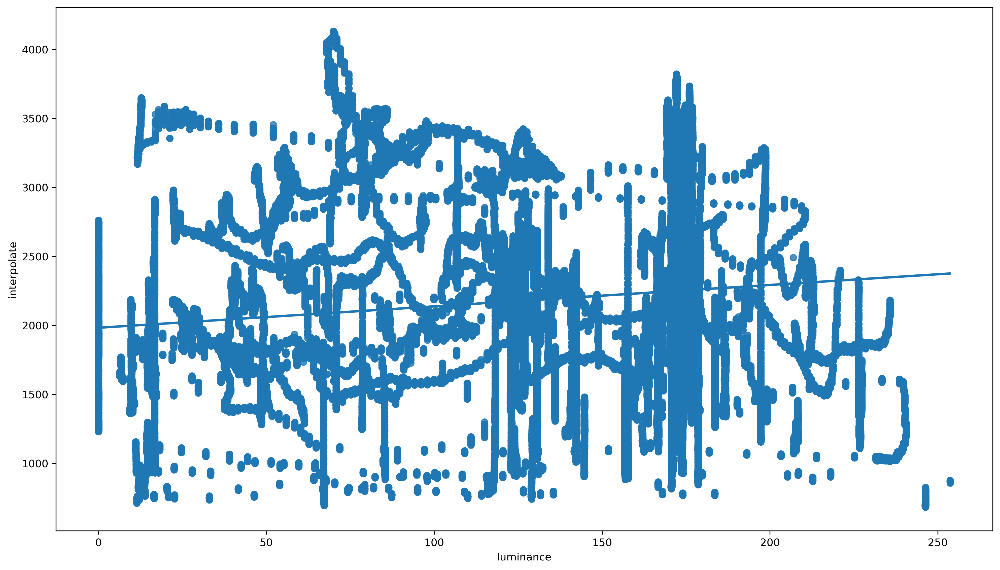

In [6]:
sns.regplot(x=bdf['luminance'][bdf['frame']!=-1], y=bdf['interpolate'][bdf['frame']!=-1])

In [7]:
gazedf = bdf[['xint', 'yint', 'frame', 'response', 'trials']]

In [8]:
xint_scaled = (bdf.xint - bdf.xint.min()) / (bdf.xint.max() - bdf.xint.min())
yint_scaled = (bdf.yint - bdf.yint.min()) / (bdf.yint.max() - bdf.yint.min())


In [9]:
gazedf.loc[:,'xint'] = xint_scaled * 1280
gazedf.loc[:,'yint'] = yint_scaled * 720

In [10]:
tmp = np.empty(bdf.shape[0])
tmp[0] = np.nan
coords = gazedf[['xint', 'yint']]

for i in range(1,len(tmp)):
    tmp[i] = math.dist(coords.iloc[i], coords.iloc[i-1])

In [11]:
gazedf.loc[:, 'delta_d'] = tmp[:]

In [12]:
gazedf.describe()

,xint,yint,frame,response,trials,delta_d
count,847451.000000,847451.000000,847451.000000,847451.000000,847451.000000,847450.000000
mean,625.771352,348.212793,12698.559947,0.000112,12.273900,2.781785
std,128.814973,89.208933,7335.499003,0.010587,25.863839,3.880484
min,0.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000
25%,577.494975,301.950142,6342.500000,0.000000,-1.000000,0.266168
50%,622.122409,334.212685,12701.000000,0.000000,-1.000000,1.432541
75%,668.701740,375.260334,19052.000000,0.000000,8.000000,3.786683
max,1280.000000,720.000000,25400.000000,1.000000,94.000000,238.561089


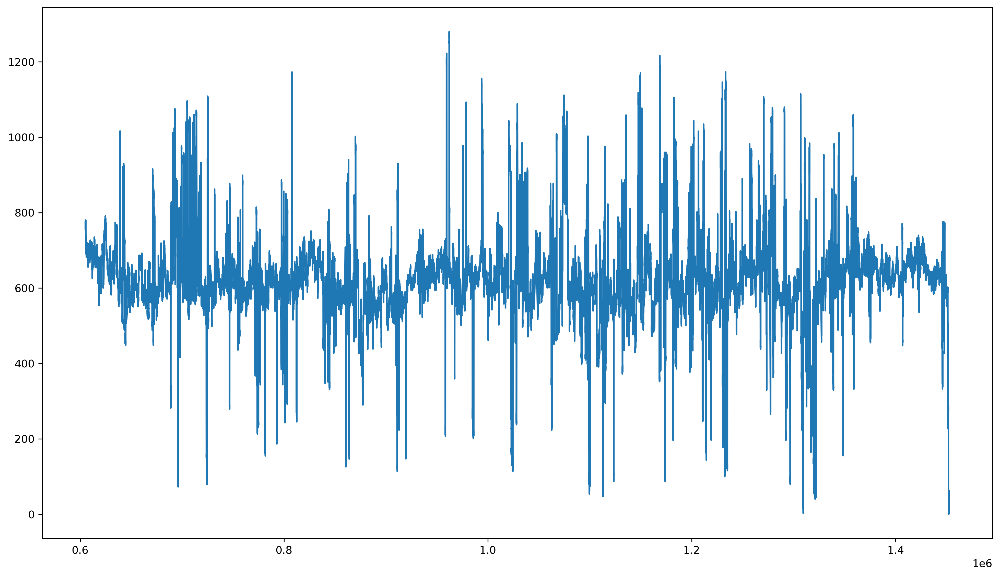

In [55]:
plt.plot(gazedf.xint)

<AxesSubplot:xlabel='xint', ylabel='yint'>

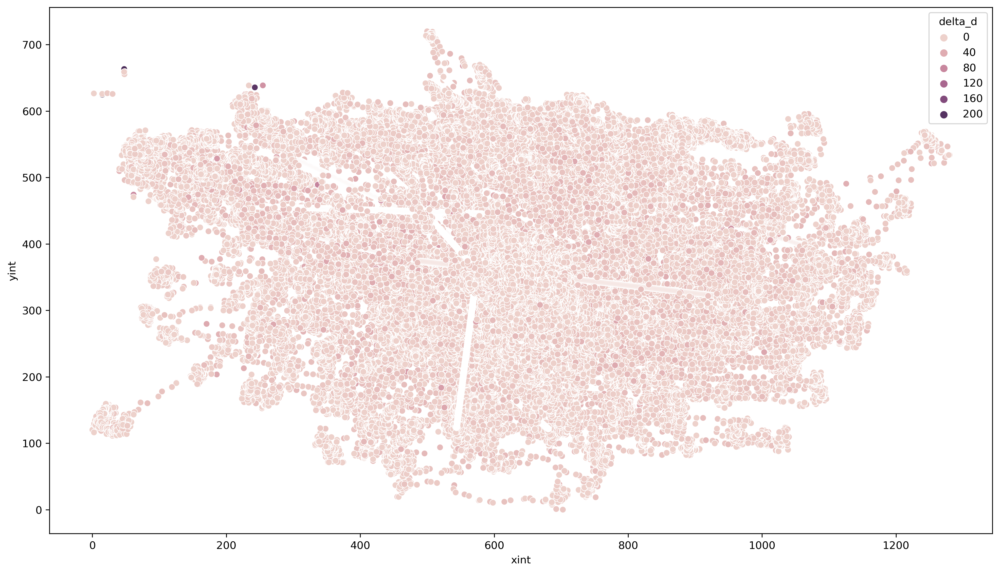

In [56]:
sns.scatterplot(data=gazedf, x='xint', y='yint', hue='delta_d')

In [13]:
gazedf['delta_d_diff1'] = gazedf.delta_d.diff()

In [14]:
from sklearn.cluster import DBSCAN, OPTICS

In [15]:
dataset = gazedf[['delta_d', 'delta_d_diff1']].dropna().values

In [16]:
optmod = OPTICS(min_samples=50, metric='euclidean', xi=.03, n_jobs=-1)
clusterxydd1 = optmod.fit(dataset)

In [18]:
len(clusterxydd1.labels_)

847449

In [19]:
tmp = [np.nan]*gazedf.shape[0]
len(tmp)

847451

In [20]:
tmp[gazedf.shape[0]-len(clusterxydd1.labels_):] = clusterxydd1.labels_

In [21]:
gazedf['labels_dd1'] = tmp

In [22]:
clusterxydd1.labels_

array([  -1, 1281,   -1, ..., 3875, 3594,   -1])

<AxesSubplot:xlabel='xint', ylabel='yint'>

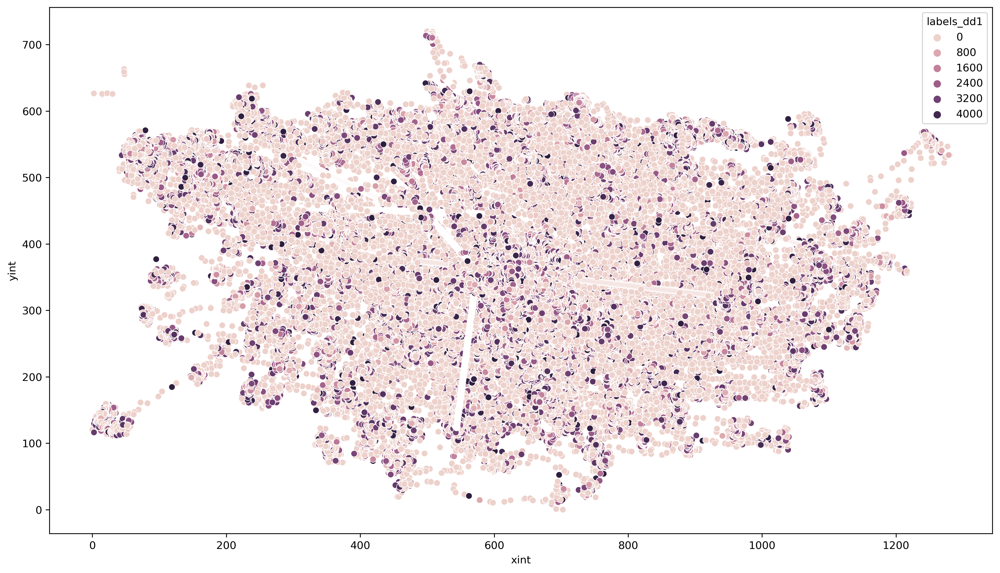

In [23]:
sns.scatterplot(data=gazedf.iloc[2:,:], x='xint', y='yint', hue='labels_dd1')

In [24]:
unique_labels = []
for l in clusterxydd1.labels_:
    if l not in unique_labels:
        unique_labels.append(l)

In [25]:
len(unique_labels)

4345

In [92]:
labeldf

,xint,yint
e_time,,
606409,693.721494,281.804986
608061,692.390656,281.956453
1146830,693.987662,280.971915
1252733,693.987662,282.789524
1339552,692.834269,282.940991


In [26]:
for l in unique_labels:
    print(l)
    fig, ax = plt.subplots(1,1)
    respdf = gazedf[['xint', 'yint']][gazedf['response']==1]
    ax.scatter(respdf.xint, respdf.yint, color='xkcd:aquamarine')
    labeldf = gazedf[['xint', 'yint']][gazedf['labels_dd1']==l]
    ax.scatter(labeldf.xint, labeldf.yint, color='xkcd:mossy green')
    fig.savefig('../gaze_img/optics_distance-speed_resp_by_cluster_'+str(l)+'.jpg')
    fig.clear()
    ax.clear()
    plt.close()

-1
1281
2277
3366
1492
3968
3671
511
3598
2494
2076
36
3091
2237
3295
1888
919
768
3423
4050
2849
1745
2876
3770
3383
1739
3624
4253
623
3457
2353
3926
2860
1892
3013
1946
3064
1476
2603
1524
1449
4136
183
1389
4221
3595
2467
2547
2090
3187
1613
2746
461
3547
734
28
170
3829
3532
746
2509
2044
3144
2122
1392
2574
3667
3522
2853
4259
2805
2190
3274
2950
1504
503
2717
1718
2351
81
2667
1855
3408
3745
2901
1850
4005
3396
2091
3188
2249
3337
2197
3279
2162
950
2219
3438
1846
2971
2736
3851
3802
851
1305
2338
1377
1464
1414
1328
3381
1735
2740
1555
115
2641
1876
3081
1872
2995
1562
1567
2696
3108
1869
3643
2619
2100
308
1078
4122
3998
3488
1203
1135
163
2592
1931
3048
1663
616
3311
1530
3719
2357
2821
1933
3050
1656
2791
2906
809
3453
4068
3358
4333
2839
1576
663
151
538
1304
925
2198
1044
545
2486
2523
738
3562
1856
2981
2803
1862
2734
3247
1538
3590
2519
1951
703
3986
2105
3199
2186
4224
194
710
2699
1649
1806
4166
4291
2827
1868
3594
890
1181
1602
2131
2434
788
732
2459
3907
2211
2875
20

1270
3008
4012
3563
1448
3571
920
208
4020
3674
45
3391
1574
4244
3858
3942
3591
2329
1482
39
3157
1431
2136
802
1213
91
3620
2799
1705
1835
2492
2642
1396
715
207
3265
1472
652
1363
2703
107
3708
3977
1102
1276
2433
3623
4186
4104
991
262
2085
1282
540
507
2260
1534
4018
2469
2346
2118
876
144
3880
2737
2406
3566
55
3226
2275
676
3956
775
3919
3676
4053
4206
1012
3567
2975
681
3127
1839
2572
1162
3975
111
2916
2287
773
2625
573
972
2819
3751
744
1824
2361
2720
2007
3554
2943
1720
688
487
3855
3276
909
3288
3505
1645
2781
1935
3960
977
3031
2487
2524
1468
2590
4087
3910
2878
1896
4061
2833
627
1952
1561
177
4042
2515
3966
3498
1168
1737
2954
2790
2077
3810
787
2516
630
1345
2658
138
1134
3761
3454
3937
2856
2157
3035
1943
3010
1080
298
3818
1361
2345
3356
1996
3333
1084
3433
1150
3281
1265
2158
4267
325
4308
1499
3813
1849
1971
1047
2674
609
136
1650
2785
1090
3469
2349
73
2649
2188
3501
3425
3732
3496
2996
1521
564
1165
1668
1113
3214
1547
2675
2834
1903
1129
819
171
2152
1604
1639
93

Traceback (most recent call last):
  File "C:\Users\Mango\anaconda3\envs\ES_Pupillometry\lib\site-packages\IPython\core\interactiveshell.py", line 3460, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\Mango\AppData\Local\Temp\ipykernel_14500\1066037355.py", line 8, in <module>
    fig.savefig('../gaze_img/optics_distance-speed_resp_by_cluster_'+str(l)+'.jpg')
  File "C:\Users\Mango\anaconda3\envs\ES_Pupillometry\lib\site-packages\matplotlib\figure.py", line 3015, in savefig
    self.canvas.print_figure(fname, **kwargs)
  File "C:\Users\Mango\anaconda3\envs\ES_Pupillometry\lib\site-packages\matplotlib\backend_bases.py", line 2255, in print_figure
    result = print_method(
  File "C:\Users\Mango\anaconda3\envs\ES_Pupillometry\lib\site-packages\matplotlib\backend_bases.py", line 1669, in wrapper
    return func(*args, **kwargs)
  File "C:\Users\Mango\anaconda3\envs\ES_Pupillometry\lib\site-packages\matplotlib\_api\deprecation.py", line 431, in wrapper
 

MemoryError: In RendererAgg: Out of memory

<Figure size 4800x2700 with 1 Axes>

In [104]:
import gc
gc.collect()

467283

Trying distance and velocity:

<AxesSubplot:xlabel='delta_d', ylabel='delta_d_diff1'>

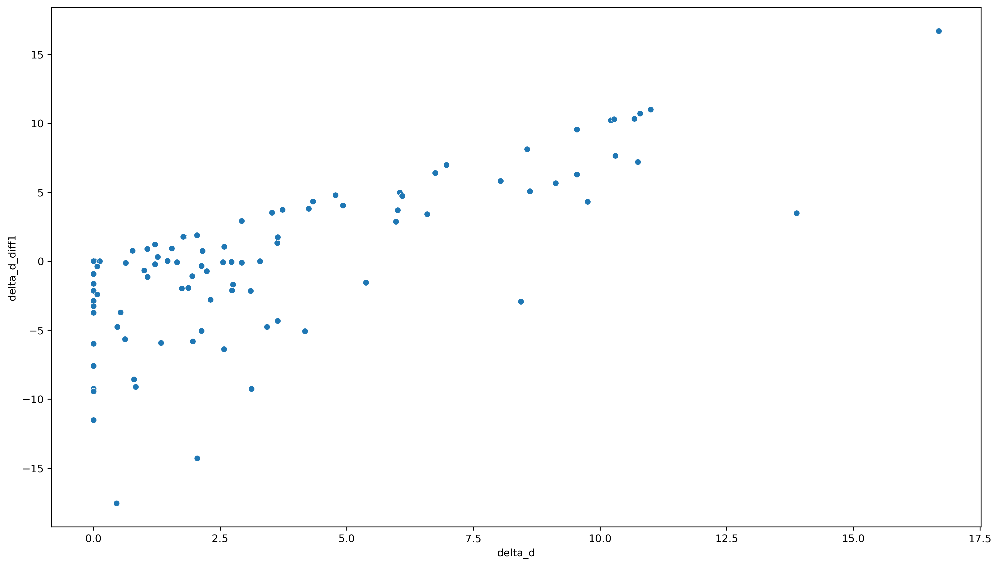

In [102]:
sns.scatterplot(data=gazedf[gazedf['response']==1], x='delta_d', y='delta_d_diff1')

Now let's try with the coordinates as well.

In [28]:
dataset = gazedf[['xint', 'yint', 'delta_d', 'delta_d_diff1']].dropna().values

In [16]:
optmod = OPTICS(min_samples=100, metric='euclidean', xi=.03, n_jobs=-1)
clusterxydd1 = optmod.fit(dataset)

In [18]:
len(clusterxydd1.labels_)

847449

In [19]:
tmp = [np.nan]*gazedf.shape[0]
len(tmp)

847451

In [20]:
tmp[gazedf.shape[0]-len(clusterxydd1.labels_):] = clusterxydd1.labels_

In [21]:
gazedf['labels_dd1'] = tmp

In [22]:
clusterxydd1.labels_

array([  -1, 1281,   -1, ..., 3875, 3594,   -1])

<AxesSubplot:xlabel='xint', ylabel='yint'>

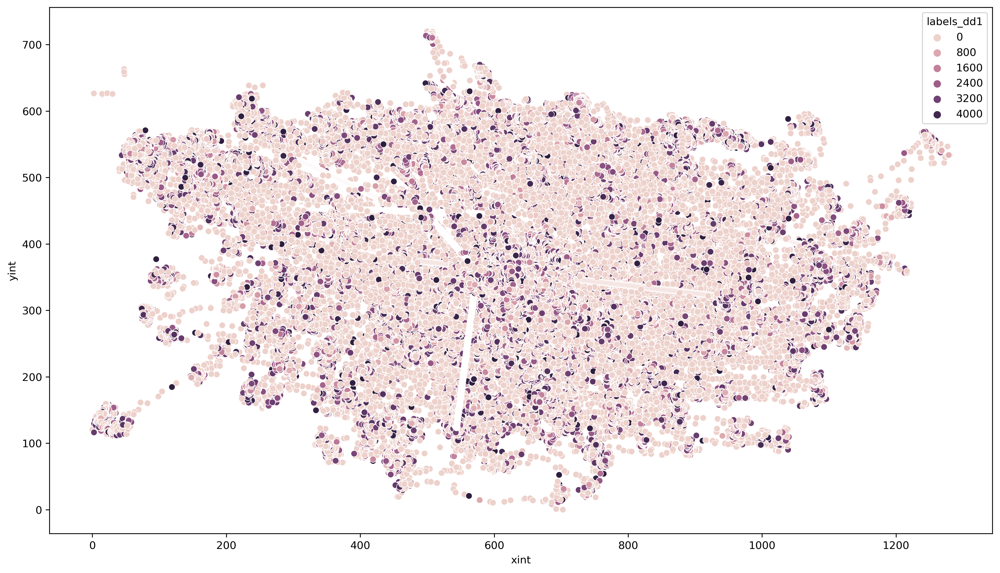

In [23]:
sns.scatterplot(data=gazedf.iloc[2:,:], x='xint', y='yint', hue='labels_dd1')

In [24]:
unique_labels = []
for l in clusterxydd1.labels_:
    if l not in unique_labels:
        unique_labels.append(l)

In [25]:
len(unique_labels)

4345

In [ ]:
for l in unique_labels:
    print(l)
    fig, ax = plt.subplots(1,1)
    respdf = gazedf[['xint', 'yint']][gazedf['response']==1]
    ax.scatter(respdf.xint, respdf.yint, color='xkcd:aquamarine')
    labeldf = gazedf[['xint', 'yint']][gazedf['labels_dd1']==l]
    ax.scatter(labeldf.xint, labeldf.yint, color='xkcd:mossy green')
    fig.savefig('../gaze_img/optics_distance-speed-coord_resp_by_cluster_'+str(l)+'.jpg')
    fig.clear()
    ax.clear()
    plt.close()

-1
1281
2277
3366
1492
3968
3671
511
3598
2494
2076
36
3091
2237
3295
1888
919
768
3423
4050
2849
1745
2876
3770
3383
1739
3624
4253
623
3457
2353
3926
2860
1892
3013
1946
3064
1476
2603
1524
1449
4136
183
1389
4221
3595
2467
2547
2090
3187
1613
2746
461
3547
734
28
170
3829
3532
746
2509
2044
3144
2122
1392
2574
3667
3522
2853
4259
2805
2190
3274
2950
1504
503
2717
1718
2351
81
2667
1855
3408
3745
2901
1850
4005
3396
2091
3188
2249
3337
2197
3279
2162
950
2219
3438
1846
2971
2736
3851
3802
851
1305
2338
1377
1464
1414
1328
3381
1735
2740
1555
115
2641
1876
3081
1872
2995
1562
1567
2696
3108
1869
3643
2619
2100
308
1078
4122
3998
3488
1203
1135
163
2592
1931
3048
1663
616
3311
1530
3719
2357
2821
1933
3050
1656
2791
2906
809
3453
4068
3358
4333
2839
1576
663
151
538
1304
925
2198
1044
545
2486
2523
738
3562
1856
2981
2803
1862
2734
3247
1538
3590
2519
1951
703
3986
2105
3199
2186
4224
194
710
2699
1649
1806
4166
4291
2827
1868
3594
890
1181
1602
2131
2434
788
732
2459
3907
2211
2875
20